<a href="https://colab.research.google.com/github/athfizh/PCVK26_05_Hafizh/blob/main/Modul%205/P5_TugasPraktikum_05.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Nama  : Athaulla Hafizh

Absen : 05

Kelas : TI-3F

NIM   : 244107020030

**Modul 5 - Histogram, Histogram Equalization, dan Dithering**

---

In [36]:
# ===== SEL IDENTITAS - JANGAN DIHAPUS, HARUS SEL PERTAMA =====
import sys, platform, hashlib, datetime, zoneinfo

NAMA = 'Athaulla Hafizh'
NIM  = '244107020030'

N      = int(NIM[-3:])
PARAM = {
    'bins' : 2 ** ((N % 4) + 3),
    'clip' : round(1.0 + (N % 5) * 0.5, 1),
    'tile' : (N % 4) + 2,
    'L'    : 2 ** ((N % 3) + 1),
}
waktu = datetime.datetime.now(zoneinfo.ZoneInfo('Asia/Jakarta'))

print('NAMA  :', NAMA)
print('NIM   :', NIM, '| N =', N)
for k, v in PARAM.items():
    print('%-6s :' % k, v)
print('WAKTU :', waktu.strftime('%Y-%m-%d %H:%M:%S %Z'))
print('SISTEM :', sys.version.split()[0], platform.platform())
kunci = NIM + '|' + waktu.strftime('%Y-%m-%d')
print('TOKEN :', hashlib.sha256(kunci.encode()).hexdigest()[:16])

NAMA  : Athaulla Hafizh
NIM   : 244107020030 | N = 30
bins   : 32
clip   : 1.0
tile   : 4
L      : 2
WAKTU : 2026-09-22 01:19:24 WIB
SISTEM : 3.13.15 Linux-6.6.122+-x86_64-with-glibc2.39
TOKEN : 7ad25469a03a9796


**Langkah Persiapan: Mount Google Drive, Import Library, dan Folder Kerja**

Variabel folder ditetapkan pada tahap inisialisasi awal. Folder CONTOH berisi citra publik dan BASE menyimpan citra personal mahasiswa.

In [37]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Import library yang dibutuhkan
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from skimage import io
import math, os, glob
!pip install numba

CONTOH = '/content/drive/MyDrive/COLLEGE/SEM 5/PCVK/BAHAN MODUL/MODUL 5'          # citra contoh bersama
BASE   = '/content/drive/MyDrive/COLLEGE/SEM 5/PCVK/BAHAN MODUL/MODUL 5'          # citra KTM milik Anda

print('CONTOH:', CONTOH)
print('BASE  :', BASE)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
CONTOH: /content/drive/MyDrive/COLLEGE/SEM 5/PCVK/BAHAN MODUL/MODUL 5
BASE  : /content/drive/MyDrive/COLLEGE/SEM 5/PCVK/BAHAN MODUL/MODUL 5


---
# **E-1 Percobaan Histogram**

Langkah pertama mencakup impor modul dan autentikasi akses.

**Langkah 3: Membuat histogram citra manual**

Tahap 1 memakai lena.jpg untuk verifikasi gambar contoh modul. Tahap 2 mengulang pada KTM1b.jpg.

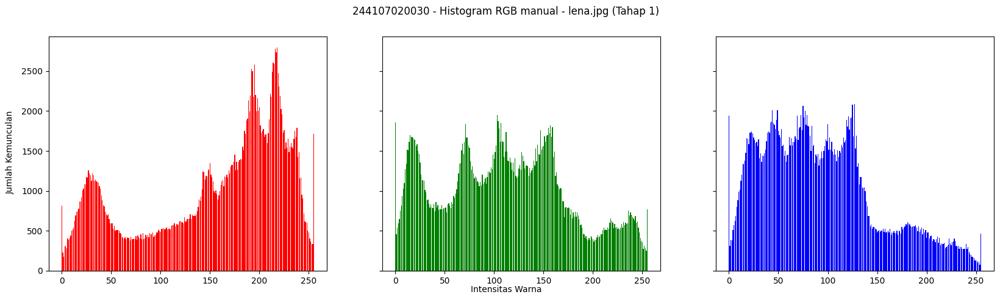

In [38]:
def histogram_manual(img_bgr):
    """Menghitung histogram RGB secara manual sesuai flowchart:
    Input image -> hitung kemunculan tiap intensitas -> histogram per kanal."""
    img = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)
    height, width, depth = np.shape(img)

    red   = [0] * 256
    green = [0] * 256
    blue  = [0] * 256

    for y in range(0, height):
        for x in range(0, width):
            red[img[y][x][0]]   += 1
            green[img[y][x][1]] += 1
            blue[img[y][x][2]]  += 1

    return np.array(red), np.array(green), np.array(blue)


def plot_histogram_rgb(red, green, blue, judul):
    names = np.arange(256)
    fig, axs = plt.subplots(1, 3, figsize=[20, 5], sharex=True, sharey=True)
    fig.suptitle(judul)
    fig.text(0.09, 0.5, 'Jumlah Kemunculan', va='center', rotation='vertical')
    fig.text(0.5, 0.04, 'Intensitas Warna', ha='center')
    axs[0].bar(names, red,   color='red')
    axs[1].bar(names, green, color='green')
    axs[2].bar(names, blue,  color='blue')
    plt.show()


# ---------- TAHAP 1: citra contoh lena.jpg ----------
img_lena = cv.imread(CONTOH + '/lena.jpg')
r_lena, g_lena, b_lena = histogram_manual(img_lena)
plot_histogram_rgb(r_lena, g_lena, b_lena, NIM + ' - Histogram RGB manual - lena.jpg (Tahap 1)')

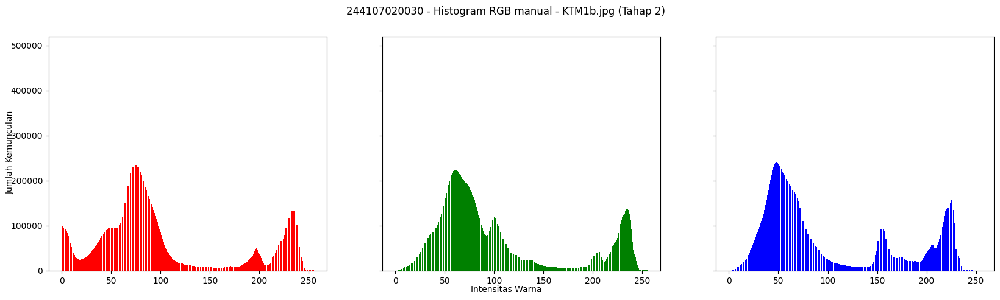

In [39]:
# ---------- TAHAP 2: citra KTM1b.jpg milik sendiri ----------
img_ktm1b = cv.imread(BASE + '/KTM1b.jpg')
assert img_ktm1b is not None, 'KTM1b.jpg tidak ditemukan di BASE, cek path Google Drive Anda'

r_ktm, g_ktm, b_ktm = histogram_manual(img_ktm1b)
plot_histogram_rgb(r_ktm, g_ktm, b_ktm, NIM + ' - Histogram RGB manual - KTM1b.jpg (Tahap 2)')

**Pertanyaan Praktikum E1**

**Soal 1:** Buatlah histogram citra yang sama menggunakan numpy.histogram dan cv.calcHist. Bandingkan ketiganya dengan menghitung selisih maksimum antar hasil. Selisihnya harus nol tampilkan pembuktiannya pada lena.jpg lebih dulu kemudian ulangi pada KTM1b.jpg.

In [40]:
def histogram_np(img_bgr):
    img = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)
    r, _ = np.histogram(img[:, :, 0], bins=256, range=(0, 256))
    g, _ = np.histogram(img[:, :, 1], bins=256, range=(0, 256))
    b, _ = np.histogram(img[:, :, 2], bins=256, range=(0, 256))
    return r, g, b


def histogram_cv(img_bgr):
    # cv.calcHist bekerja langsung pada urutan channel BGR sesuai cv.imread
    b = cv.calcHist([img_bgr], [0], None, [256], [0, 256]).flatten().astype(np.int64)
    g = cv.calcHist([img_bgr], [1], None, [256], [0, 256]).flatten().astype(np.int64)
    r = cv.calcHist([img_bgr], [2], None, [256], [0, 256]).flatten().astype(np.int64)
    return r, g, b


def bandingkan_histogram(img_bgr, r_manual, g_manual, b_manual, nama_citra):
    r_np, g_np, b_np = histogram_np(img_bgr)
    r_cv, g_cv, b_cv = histogram_cv(img_bgr)

    selisih_manual_np = max(
        np.max(np.abs(r_manual - r_np)),
        np.max(np.abs(g_manual - g_np)),
        np.max(np.abs(b_manual - b_np)),
    )
    selisih_manual_cv = max(
        np.max(np.abs(r_manual - r_cv)),
        np.max(np.abs(g_manual - g_cv)),
        np.max(np.abs(b_manual - b_cv)),
    )
    selisih_np_cv = max(
        np.max(np.abs(r_np - r_cv)),
        np.max(np.abs(g_np - g_cv)),
        np.max(np.abs(b_np - b_cv)),
    )

    print(f'--- {nama_citra} ---')
    print('Selisih maksimum manual  vs numpy.histogram :', selisih_manual_np)
    print('Selisih maksimum manual  vs cv.calcHist      :', selisih_manual_cv)
    print('Selisih maksimum numpy   vs cv.calcHist      :', selisih_np_cv)
    if selisih_manual_np == 0 and selisih_manual_cv == 0 and selisih_np_cv == 0:
        print('=> KETIGANYA IDENTIK (selisih = 0). Implementasi manual sudah benar.')
    else:
        print('=> Ada selisih tidak nol, periksa kembali implementasi manual.')
    print()


# Pembuktian pada lena.jpg
bandingkan_histogram(img_lena, r_lena, g_lena, b_lena, NIM + ' - lena.jpg')

# Pembuktian pada KTM1b.jpg
bandingkan_histogram(img_ktm1b, r_ktm, g_ktm, b_ktm, NIM + ' - KTM1b.jpg')

--- 244107020030 - lena.jpg ---
Selisih maksimum manual  vs numpy.histogram : 0
Selisih maksimum manual  vs cv.calcHist      : 0
Selisih maksimum numpy   vs cv.calcHist      : 0
=> KETIGANYA IDENTIK (selisih = 0). Implementasi manual sudah benar.

--- 244107020030 - KTM1b.jpg ---
Selisih maksimum manual  vs numpy.histogram : 0
Selisih maksimum manual  vs cv.calcHist      : 0
Selisih maksimum numpy   vs cv.calcHist      : 0
=> KETIGANYA IDENTIK (selisih = 0). Implementasi manual sudah benar.



**Soal 2:** Gambarkan histogram ternormalisasi p(j) dan kurva CDF untuk KTM1a.jpg sampai KTM1d.jpg dalam satu figure 2x2. Jelaskan perbedaan bentuk kurva CDF antara citra paling gelap dan citra paling terang milik Anda lalu kaitkan dengan kondisi pencahayaan saat akuisisi pada Pertemuan 2.

List kondisi akuisisi:
- KTM1a.jpg: dalam ruangan gelap
- KTM1b.jpg: dalam ruangan dengan lampu
- KTM1c.jpg: dalam ruangan dengan flash
- KTM1d.jpg: luar ruangan dengan cahaya matahari

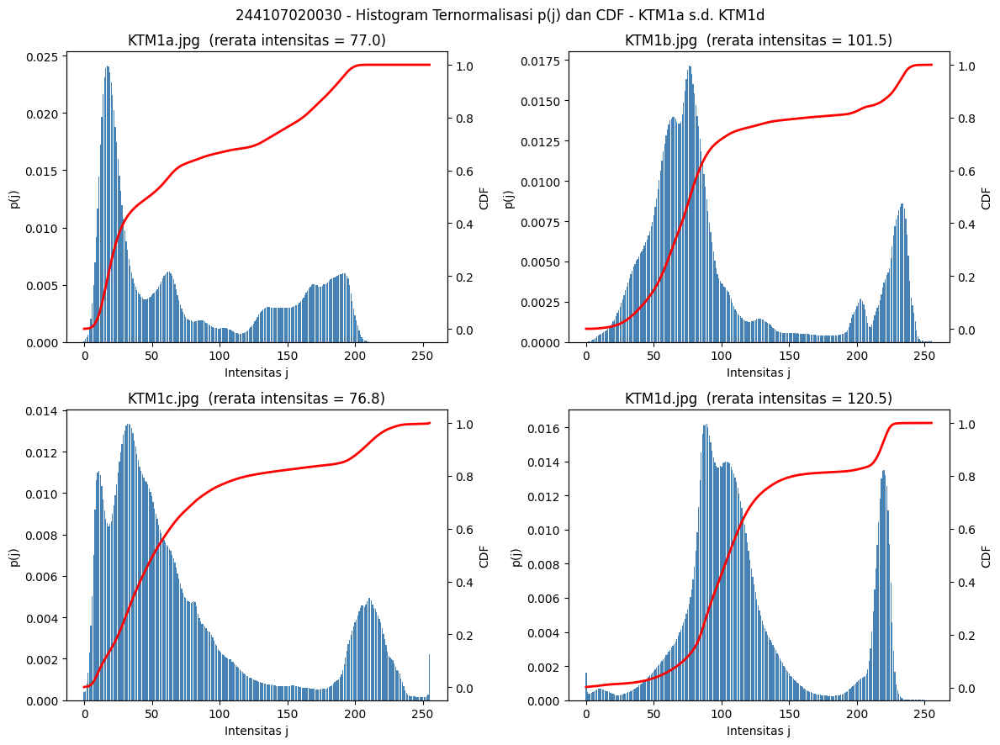

Rerata intensitas tiap citra (dari gelap ke terang urutan nilai ini yang menentukan):
  KTM1a.jpg : 77.05
  KTM1b.jpg : 101.48
  KTM1c.jpg : 76.82
  KTM1d.jpg : 120.49

=> Berdasarkan rerata intensitas hasil komputasi di atas, citra PALING GELAP adalah KTM1c.jpg, dan citra PALING TERANG adalah KTM1d.jpg.


In [41]:
nama_file_ktm = ['KTM1a.jpg', 'KTM1b.jpg', 'KTM1c.jpg', 'KTM1d.jpg']

fig, axs = plt.subplots(2, 2, figsize=(12, 9))
fig.suptitle(NIM + ' - Histogram Ternormalisasi p(j) dan CDF - KTM1a s.d. KTM1d')

rerata_kecerahan = {}

for idx, nama in enumerate(nama_file_ktm):
    gray = cv.imread(BASE + '/' + nama, cv.IMREAD_GRAYSCALE)
    assert gray is not None, f'{nama} tidak ditemukan di BASE'

    h = np.zeros(256, dtype=np.int64)
    for y in range(gray.shape[0]):
        for x in range(gray.shape[1]):
            h[gray[y, x]] += 1
    # Untuk citra berukuran besar gunakan versi cepat (hasil sama persis):
    # h = cv.calcHist([gray], [0], None, [256], [0, 256]).flatten()

    p   = h / gray.size
    cdf = np.cumsum(p)
    rerata_kecerahan[nama] = gray.mean()

    ax = axs[idx // 2, idx % 2]
    ax.bar(np.arange(256), p, color='steelblue', label='p(j)')
    ax2 = ax.twinx()
    ax2.plot(np.arange(256), cdf, color='red', linewidth=2, label='CDF')
    ax.set_title(f'{nama}  (rerata intensitas = {gray.mean():.1f})')
    ax.set_xlabel('Intensitas j')
    ax.set_ylabel('p(j)')
    ax2.set_ylabel('CDF')

plt.tight_layout()
plt.show()

print('Rerata intensitas tiap citra (dari gelap ke terang urutan nilai ini yang menentukan):')
for nama, v in rerata_kecerahan.items():
    print(f'  {nama} : {v:.2f}')

paling_gelap  = min(rerata_kecerahan, key=rerata_kecerahan.get)
paling_terang = max(rerata_kecerahan, key=rerata_kecerahan.get)
print()
print(f'=> Berdasarkan rerata intensitas hasil komputasi di atas, citra PALING GELAP adalah {paling_gelap}, '
      f'dan citra PALING TERANG adalah {paling_terang}.')

**Jawaban Analisa:**

Berdasarkan rata-rata intensitas, KTM1c memiliki nilai rata-rata paling rendah yaitu 76,82 sehingga merupakan citra paling gelap. KTM1d memiliki rata-rata intensitas tertinggi yaitu 120,49 sehingga merupakan citra paling terang. Pada KTM1c, distribusi piksel relatif lebih banyak berada pada intensitas rendah sehingga CDF mencapai kenaikan utama lebih awal. Pada KTM1d, distribusi bergeser ke intensitas yang lebih tinggi sehingga CDF mengalami kenaikan lebih lanjut pada rentang intensitas tinggi. Hasil tersebut kemudian dikaitkan dengan kondisi akuisisi: KTM1c diambil menggunakan flash, sedangkan KTM1d diambil di luar ruangan dengan cahaya matahari.

**Soal 3:** Ulangi histogram KTM1b.jpg dengan jumlah bin sebesar PARAM['bins'] (32) dan 256 bin. Tampilkan keduanya berdampingan dan jelaskan informasi yang hilang ketika jumlah bin dikurangi.

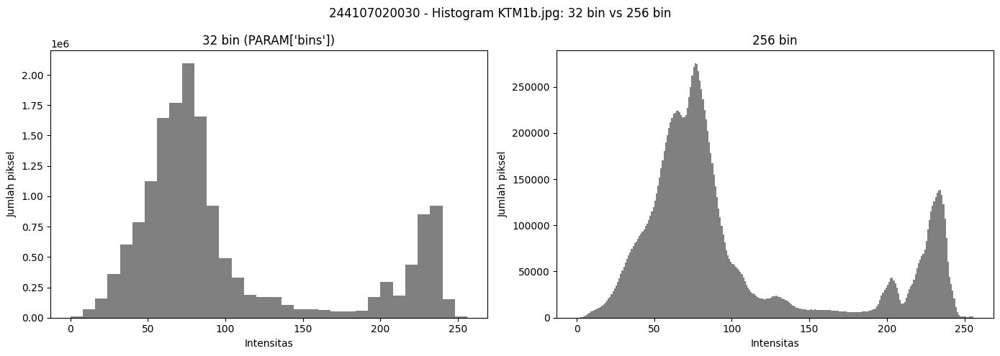

In [42]:
gray_ktm1b = cv.imread(BASE + '/KTM1b.jpg', cv.IMREAD_GRAYSCALE)

fig, axs = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle(NIM + f" - Histogram KTM1b.jpg: {PARAM['bins']} bin vs 256 bin")

axs[0].hist(gray_ktm1b.ravel(), bins=PARAM['bins'], range=(0, 256), color='gray')
axs[0].set_title(f"{PARAM['bins']} bin (PARAM['bins'])")
axs[0].set_xlabel('Intensitas'); axs[0].set_ylabel('Jumlah piksel')

axs[1].hist(gray_ktm1b.ravel(), bins=256, range=(0, 256), color='gray')
axs[1].set_title('256 bin')
axs[1].set_xlabel('Intensitas'); axs[1].set_ylabel('Jumlah piksel')

plt.tight_layout()
plt.show()

**Jawaban Analisa:**

Pengurangan jumlah bin dari 256 menjadi 32 menyebabkan pengelompokan 8 nilai intensitas berdekatan menjadi satu batang histogram. Hal ini menghilangkan detail sebaran piksel sehingga variasi kecil antar intensitas tidak terlihat. Puncak dan lembah minor yang berdekatan menyatu menjadi satu entitas. Presisi analisis kuantitatif seperti perhitungan CDF atau penentuan nilai ambang threshold juga tereduksi karena hilangnya rincian data spesifik. Histogram dengan resolusi bin minim memang tampak lebih halus secara visual namun mereduksi karakteristik detail penyebaran sinyal optik asli.

---
# **E-2 Percobaan Histogram Equalization**

**Langkah 1: Histogram Equalization manual**

Rumus yang digunakan:
$$K_o = \text{round}\left(\frac{C_i \cdot (2^k - 1)}{w \cdot h}\right)$$

Dimana Ci merupakan distribusi kumulatif, rentang maksimal 255, dan wh adalah dimensi matriks. Tahap 1 memakai lena_lc.jpg dan tahap 2 diaplikasikan pada KTM1a.jpg.

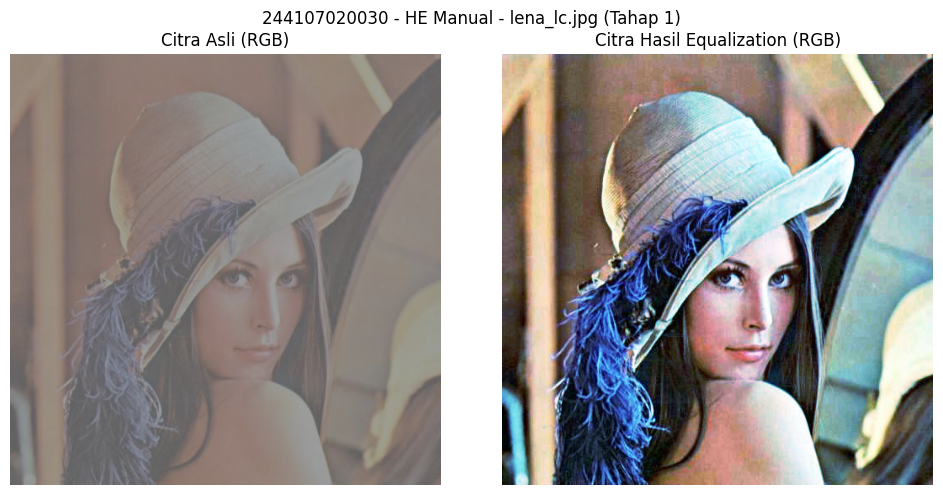

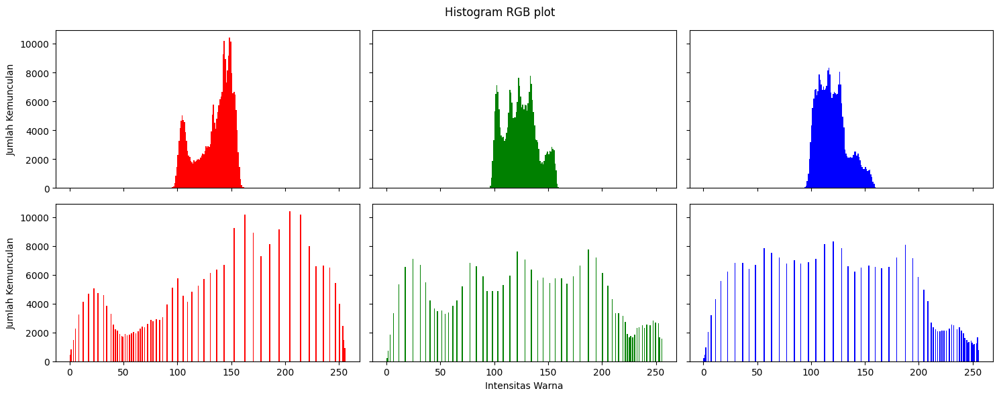

In [43]:
def histogram_equalization_manual(gray):
    """Implementasi manual sesuai flowchart:
    hitung frekuensi -> kumulatif -> normalisasi -> K0 = round((L-1)*CDF) -> transformasi citra."""
    L = 256
    MN = gray.size

    # 1. Frekuensi
    h = np.zeros(L, dtype=np.int64)
    for y in range(gray.shape[0]):
        for x in range(gray.shape[1]):
            h[gray[y, x]] += 1

    # 2 & 3. Kumulatif dan normalisasi (p dan CDF)
    p   = h / MN
    cdf = np.cumsum(p)

    # 4. Implementasi rumus Ko (skala warna, dibulatkan ke integer terdekat)
    lut = np.round((L - 1) * cdf).astype(np.uint8)

    # 5. Transformasi kembali dalam bentuk citra (mapping lookup table)
    hasil = lut[gray]
    return hasil, h, p, cdf, lut


def tampilkan_before_after_color(bgr, judul_prefix):
    # Pisahkan channel B, G, R
    b, g, r = cv.split(bgr)

    # HE manual per channel
    b_eq, _, _, _, _ = histogram_equalization_manual(b)
    g_eq, _, _, _, _ = histogram_equalization_manual(g)
    r_eq, _, _, _, _ = histogram_equalization_manual(r)

    # Gabungkan channel BGR
    bgr_eq = cv.merge((b_eq, g_eq, r_eq))

    # Konversi BGR -> RGB untuk matplotlib
    rgb = cv.cvtColor(bgr, cv.COLOR_BGR2RGB)
    rgb_eq = cv.cvtColor(bgr_eq, cv.COLOR_BGR2RGB)

    # --- 1. Tampilkan citra sebelum & sesudah (Gambar seperti halaman 15) ---
    fig_img, axs_img = plt.subplots(1, 2, figsize=(10, 5))
    fig_img.suptitle(judul_prefix)

    axs_img[0].imshow(rgb)
    axs_img[0].set_title('Citra Asli (RGB)')
    axs_img[0].axis('off')

    axs_img[1].imshow(rgb_eq)
    axs_img[1].set_title('Citra Hasil Equalization (RGB)')
    axs_img[1].axis('off')

    plt.tight_layout()
    plt.show()

    # --- 2. Tampilkan Histogram RGB Plot (Gambar seperti halaman 16) ---
    fig_hist, axs_hist = plt.subplots(2, 3, figsize=(15, 6), sharex=True, sharey=True)
    fig_hist.suptitle('Histogram RGB plot')

    colors = ['red', 'green', 'blue']
    channels_asli = [r, g, b]
    channels_eq = [r_eq, g_eq, b_eq]

    for i in range(3):
        # Baris 1: Histogram Asli
        axs_hist[0, i].hist(channels_asli[i].ravel(), bins=256, range=(0,256), color=colors[i])
        # Baris 2: Histogram Equalized
        axs_hist[1, i].hist(channels_eq[i].ravel(), bins=256, range=(0,256), color=colors[i])

    # Menambahkan label sesuai modul
    axs_hist[1, 1].set_xlabel('Intensitas Warna')
    axs_hist[0, 0].set_ylabel('Jumlah Kemunculan')
    axs_hist[1, 0].set_ylabel('Jumlah Kemunculan')

    plt.tight_layout()
    plt.show()

    return bgr_eq


# ---------- TAHAP 1: citra contoh lena_lc.jpg ----------
# Sesuai modul, gambar yang digunakan dan histogram yang ditampilkan adalah versi berwarna (RGB)
bgr_lena_lc = cv.imread(CONTOH + '/lena_lc.jpg')
hasil_lena_lc_manual_color = tampilkan_before_after_color(bgr_lena_lc, NIM + ' - HE Manual - lena_lc.jpg (Tahap 1)')

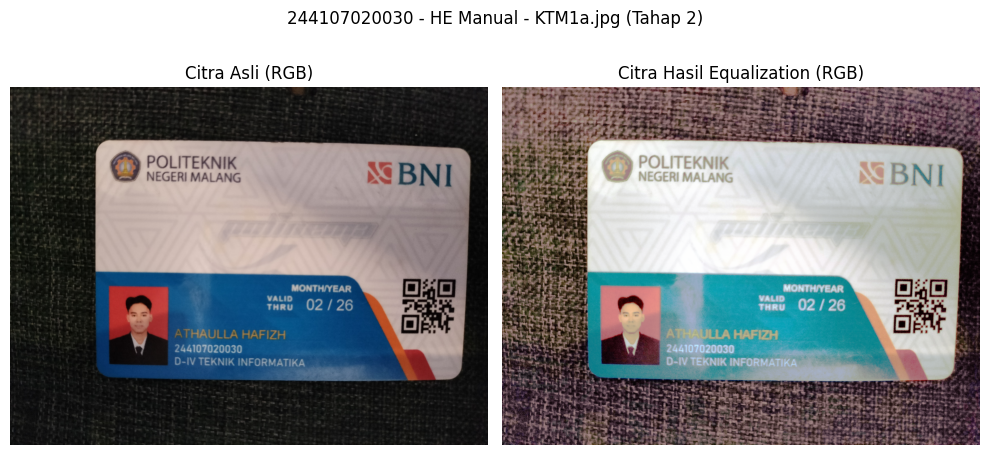

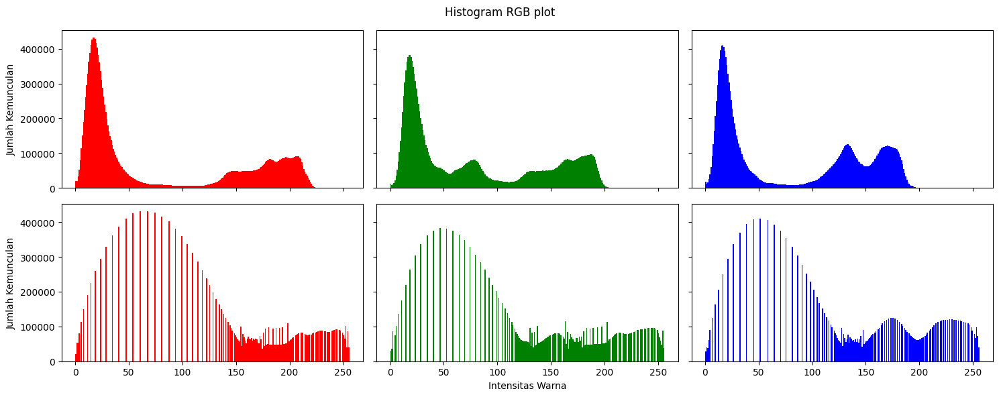

In [44]:
# ---------- TAHAP 2: citra KTM1a.jpg milik sendiri (ruangan gelap) ----------
bgr_ktm1a = cv.imread(BASE + '/KTM1a.jpg')
assert bgr_ktm1a is not None, 'KTM1a.jpg tidak ditemukan di BASE'

hasil_ktm1a_manual_color = tampilkan_before_after_color(bgr_ktm1a, NIM + ' - HE Manual - KTM1a.jpg (Tahap 2)')

**Langkah 2: Perbandingan fungsi cv.equalizeHist**

Bandingkan fungsi equalizeHist OpenCV dengan metode manual melalui kalkulasi deviasi maksimal antara keduanya pada gambar lena_lc.jpg maupun KTM1a.jpg.

In [45]:
def bandingkan_equalize(bgr, hasil_manual_color, nama_citra):
    # Equalize menggunakan OpenCV (per channel)
    b, g, r = cv.split(bgr)
    b_eq = cv.equalizeHist(b)
    g_eq = cv.equalizeHist(g)
    r_eq = cv.equalizeHist(r)
    hasil_cv_color = cv.merge((b_eq, g_eq, r_eq))

    # Hitung selisih maksimum
    selisih = np.abs(hasil_manual_color.astype(np.int16) - hasil_cv_color.astype(np.int16))
    selisih_maks = int(np.max(selisih))
    jumlah_piksel_beda = int(np.sum(selisih > 0))

    print(f'--- {nama_citra} ---')
    print('Selisih maksimum manual vs cv.equalizeHist :', selisih_maks)
    print('Jumlah piksel/channel yang berbeda         :', jumlah_piksel_beda, 'dari', bgr.size, 'nilai')
    print()
    return hasil_cv_color, selisih_maks

hasil_lena_lc_cv_color, selisih_lena_lc = bandingkan_equalize(bgr_lena_lc, hasil_lena_lc_manual_color, NIM + ' - lena_lc.jpg')
hasil_ktm1a_cv_color, selisih_ktm1a = bandingkan_equalize(bgr_ktm1a, hasil_ktm1a_manual_color, NIM + ' - KTM1a.jpg')

--- 244107020030 - lena_lc.jpg ---
Selisih maksimum manual vs cv.equalizeHist : 0
Jumlah piksel/channel yang berbeda         : 0 dari 786432 nilai

--- 244107020030 - KTM1a.jpg ---
Selisih maksimum manual vs cv.equalizeHist : 1
Jumlah piksel/channel yang berbeda         : 6099320 dari 48108096 nilai



**Jawaban Analisa:**

Perbedaan maksimum 0 pada lena_lc.jpg dan 1 pada KTM1a.jpg terjadi karena implementasi manual menggunakan CDF langsung, sedangkan OpenCV melakukan normalisasi dengan mempertimbangkan nilai CDF minimum yang tidak nol. Perbedaan pembulatan antara implementasi Python dan OpenCV juga dapat menghasilkan selisih sebesar 1 tingkat intensitas. Oleh karena itu, hasil keduanya sangat dekat, tetapi tidak selalu identik pada setiap piksel.

**Langkah 3: Ekualisasi citra berwarna**

Cara pertama menerapkan ekualisasi kanal RGB terpisah. Cara kedua memisahkan parameter luminasi kecerahan dari pigmen warna asli. Tahap 1 menggunakan lena.jpg dan tahap 2 memakai KTM1d.jpg.

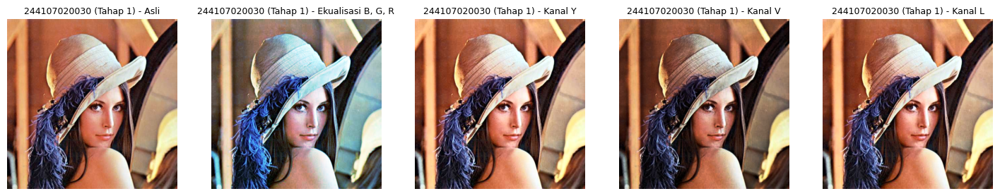

Cara                    geser Hue (der)    rerata terang
Asli                               0.00            122.2
Ekualisasi B, G, R                53.03            127.4
Kanal Y                            0.40            127.9
Kanal V                            0.87            100.6
Kanal L                            1.65            122.7


In [46]:
def geser_hue(asli, hasil):
    h1 = cv.cvtColor(asli,  cv.COLOR_BGR2HSV)[:, :, 0].astype(np.int16)
    h2 = cv.cvtColor(hasil, cv.COLOR_BGR2HSV)[:, :, 0].astype(np.int16)
    d = np.abs(h1 - h2)
    d = np.minimum(d, 180 - d)          # Hue melingkar 0-179
    return d.mean()


def equalisasi_warna(bgr):
    # cara 1: tiap kanal diekualisasi sendiri-sendiri
    kanal = list(cv.split(bgr))
    for i in range(3):
        kanal[i] = cv.equalizeHist(kanal[i])
    he_rgb = cv.merge(kanal)

    # cara 2: hanya kanal terang yang diekualisasi
    ycrcb   = cv.cvtColor(bgr, cv.COLOR_BGR2YCrCb)
    y, cr, cb = cv.split(ycrcb)
    he_y = cv.cvtColor(cv.merge([cv.equalizeHist(y), cr, cb]), cv.COLOR_YCrCb2BGR)

    hsv        = cv.cvtColor(bgr, cv.COLOR_BGR2HSV)
    h, sat, v  = cv.split(hsv)
    he_v = cv.cvtColor(cv.merge([h, sat, cv.equalizeHist(v)]), cv.COLOR_HSV2BGR)

    lab       = cv.cvtColor(bgr, cv.COLOR_BGR2LAB)
    l, a, b   = cv.split(lab)
    he_l = cv.cvtColor(cv.merge([cv.equalizeHist(l), a, b]), cv.COLOR_LAB2BGR)

    return he_rgb, he_y, he_v, he_l


def tampilkan_dan_tabel(bgr, judul_prefix):
    he_rgb, he_y, he_v, he_l = equalisasi_warna(bgr)

    judul = ['Asli', 'Ekualisasi B, G, R', 'Kanal Y', 'Kanal V', 'Kanal L']
    citra = [bgr, he_rgb, he_y, he_v, he_l]

    plt.figure(figsize=(18, 4))
    for i, (c, t) in enumerate(zip(citra, judul), 1):
        plt.subplot(1, 5, i)
        plt.imshow(cv.cvtColor(c, cv.COLOR_BGR2RGB))
        plt.title(judul_prefix + ' - ' + t, fontsize=9)
        plt.axis('off')
    plt.show()

    print('%-22s %16s %16s' % ('Cara', 'geser Hue (der)', 'rerata terang'))
    hasil_tabel = {}
    for t, c in zip(judul, citra):
        g_hue = geser_hue(bgr, c) * 2
        rerata = cv.cvtColor(c, cv.COLOR_BGR2GRAY).mean()
        hasil_tabel[t] = (g_hue, rerata)
        print('%-22s %16.2f %16.1f' % (t, g_hue, rerata))

    return hasil_tabel


# ---------- TAHAP 1: lena.jpg ----------
bgr_lena = cv.imread(CONTOH + '/lena.jpg')
_ = tampilkan_dan_tabel(bgr_lena, NIM + ' (Tahap 1)')

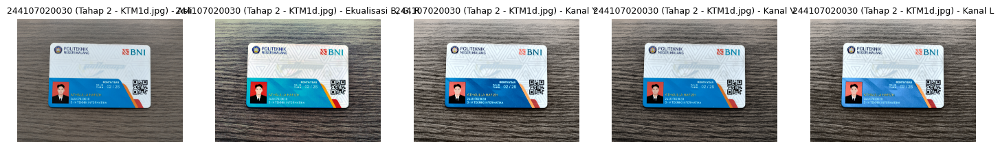

Cara                    geser Hue (der)    rerata terang
Asli                               0.00            120.7
Ekualisasi B, G, R                45.91            125.2
Kanal Y                            0.97            129.1
Kanal V                            2.48            112.5
Kanal L                            3.16            122.5

=> Cara dengan pergeseran Hue TERBESAR pada citra Anda: 'Ekualisasi B, G, R' (45.91 derajat)
=> Di antara kanal Y, V, L, yang pergeseran Hue-nya PALING KECIL pada citra Anda: 'Kanal Y' (0.97 derajat)


In [47]:
# ---------- TAHAP 2: KTM1d.jpg milik sendiri ----------
bgr_ktm1d = cv.imread(BASE + '/KTM1d.jpg')
assert bgr_ktm1d is not None, 'KTM1d.jpg tidak ditemukan di BASE'

tabel_ktm1d = tampilkan_dan_tabel(bgr_ktm1d, NIM + ' (Tahap 2 - KTM1d.jpg)')

print()
cara_hue_terbesar = max(tabel_ktm1d, key=lambda k: tabel_ktm1d[k][0])
print(f"=> Cara dengan pergeseran Hue TERBESAR pada citra Anda: '{cara_hue_terbesar}' "
      f"({tabel_ktm1d[cara_hue_terbesar][0]:.2f} derajat)")

cara_kanal_terang = {k: v for k, v in tabel_ktm1d.items() if k in ['Kanal Y', 'Kanal V', 'Kanal L']}
cara_hue_terkecil_terang = min(cara_kanal_terang, key=lambda k: cara_kanal_terang[k][0])
print(f"=> Di antara kanal Y, V, L, yang pergeseran Hue-nya PALING KECIL pada citra Anda: '{cara_hue_terkecil_terang}' "
      f"({cara_kanal_terang[cara_hue_terkecil_terang][0]:.2f} derajat)")

**Jawaban Analisa:**

Berdasarkan metrik pergeseran Hue, kanal Y memiliki pergeseran paling kecil, yaitu 0,97°, dibandingkan kanal V sebesar 2,48° dan kanal L sebesar 3,16°. Hal ini menunjukkan bahwa pada citra KTM1d, ekualisasi kanal Y paling sedikit mengubah informasi Hue. Penilaian visual difokuskan pada area nama dan NIM pada kartu serta latar di sekitar kartu.

1. Ekualisasi terpisah pada kanal B, G, R menghasilkan pergeseran hue terbesar akibat perbedaan fungsi pemetaan masing-masing saluran warna yang merubah proporsi asli.
2. Pergeseran hue pada kanal terang tetap terjadi akibat akumulasi galat pembulatan saat konversi ruang warna dari matriks desimal ke bentuk integer. Mekanisme pemotongan rentang sinyal saat konversi balik ke struktur RGB turut merubah rasio awal.
3. Kanal pemrosesan intensitas dengan nilai deviasi terendah memberikan hasil optimal dalam mempertahankan akurasi tekstur warna wajah dan latar objek tanpa distorsi kromatik yang berlebih.
4. (Penerapan metode CLAHE pada komponen pencahayaan direalisasikan pada segmen kode selanjutnya).

**Langkah 4: Kanal terang dengan CLAHE**

Mengaplikasikan teknik ekualisasi lokal CLAHE pada kanal pencahayaan dengan nilai kliping spesifik sebagai perbandingan performa terukur.

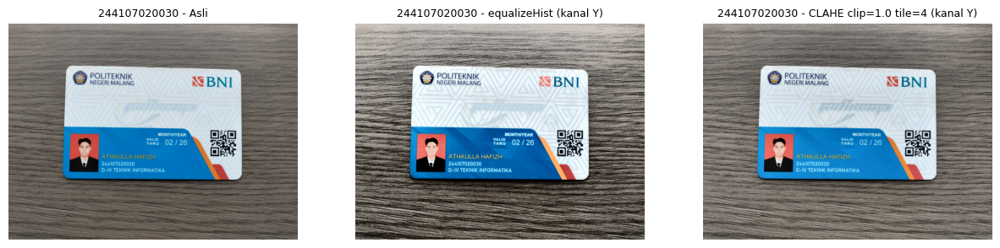

Cara                            geser Hue (der)    rerata terang
equalizeHist (kanal Y)                     0.97            129.1
CLAHE (kanal Y)                            0.03            130.1


In [48]:
clahe = cv.createCLAHE(clipLimit=PARAM['clip'], tileGridSize=(PARAM['tile'], PARAM['tile']))

ycrcb_d      = cv.cvtColor(bgr_ktm1d, cv.COLOR_BGR2YCrCb)
y_d, cr_d, cb_d = cv.split(ycrcb_d)

y_equalize = cv.equalizeHist(y_d)
y_clahe    = clahe.apply(y_d)

hasil_equalize_y = cv.cvtColor(cv.merge([y_equalize, cr_d, cb_d]), cv.COLOR_YCrCb2BGR)
hasil_clahe_y    = cv.cvtColor(cv.merge([y_clahe, cr_d, cb_d]), cv.COLOR_YCrCb2BGR)

fig, axs = plt.subplots(1, 3, figsize=(15, 5))
for ax, img, judul in zip(
        axs,
        [bgr_ktm1d, hasil_equalize_y, hasil_clahe_y],
        ['Asli', 'equalizeHist (kanal Y)', f"CLAHE clip={PARAM['clip']} tile={PARAM['tile']} (kanal Y)"]):
    ax.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    ax.set_title(NIM + ' - ' + judul, fontsize=9)
    ax.axis('off')
plt.show()

print('%-30s %16s %16s' % ('Cara', 'geser Hue (der)', 'rerata terang'))
for t, c in zip(['equalizeHist (kanal Y)', 'CLAHE (kanal Y)'], [hasil_equalize_y, hasil_clahe_y]):
    g_hue = geser_hue(bgr_ktm1d, c) * 2
    rerata = cv.cvtColor(c, cv.COLOR_BGR2GRAY).mean()
    print('%-30s %16.2f %16.1f' % (t, g_hue, rerata))

**Jawaban Analisa:**

Pada citra KTM1d, CLAHE pada kanal Y menghasilkan pergeseran Hue 0,03°, lebih kecil dibandingkan equalizeHist pada kanal Y sebesar 0,97°. Rerata kecerahannya juga berubah dari 120,7 pada citra asli menjadi 130,1, sedangkan equalizeHist menghasilkan 129,1.

---
**Pertanyaan Praktikum E2**

**Soal 1: Ekualisasi global citra KTM**

a. Terapkan ekualisasi manual dan cv.equalizeHist pada versi grayscale KTM1a.jpg.

b. Tampilkan citra asli, hasil ekualisasi, dan histogram dalam satu panel komparasi.

c. Hitung metrik PSNR dan analisis penyebab penurunan performa parameter tersebut saat citra tampak lebih tajam.

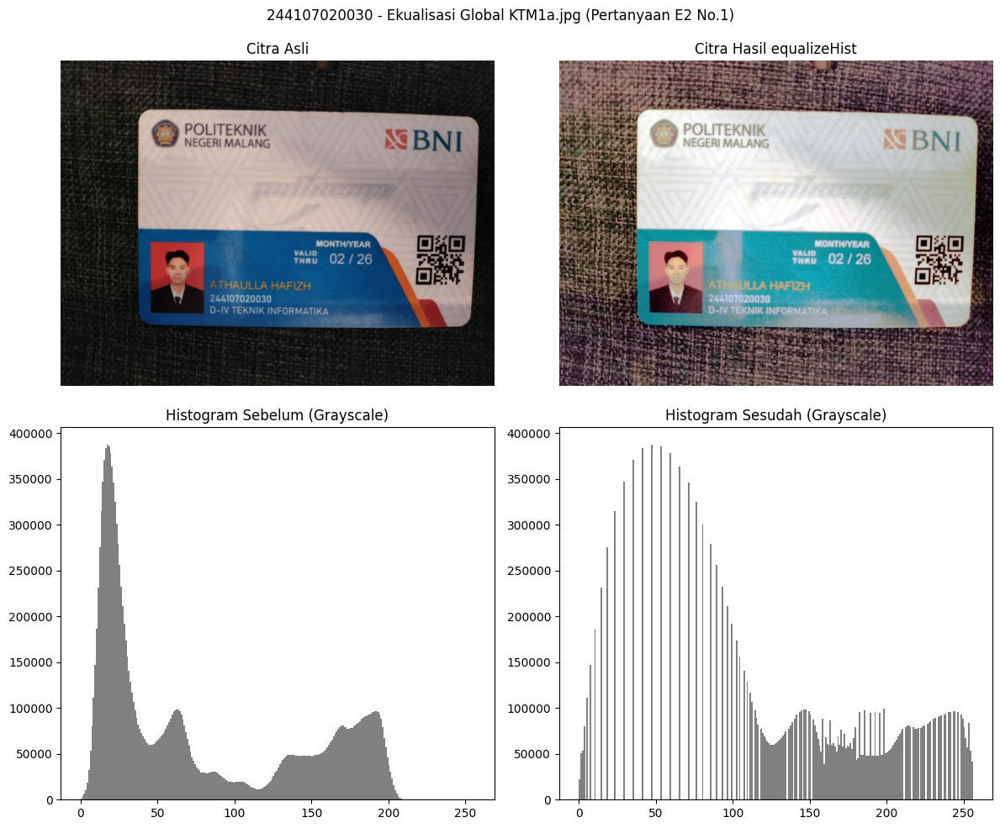

MSE  (asli vs hasil manual)      : 3249.77
PSNR (asli vs hasil manual)      : 13.01 dB
MSE  (asli vs hasil equalizeHist): 3247.61
PSNR (asli vs hasil equalizeHist): 13.02 dB  (cv.PSNR bawaan: 13.02 dB)


In [49]:
# 1a. Ekualisasi manual dan cv.equalizeHist pada KTM1a.jpg
#     (hasil_ktm1a_manual_color & hasil_ktm1a_cv_color sudah dihitung di cell sebelumnya)

# Konversi ke grayscale hanya untuk keperluan tampilan histogram dan PSNR
gray_ktm1a_for_psnr = cv.imread(BASE + '/KTM1a.jpg', cv.IMREAD_GRAYSCALE)
hasil_ktm1a_cv_gray = cv.equalizeHist(gray_ktm1a_for_psnr)
hasil_ktm1a_manual_gray, _, _, _, _ = histogram_equalization_manual(gray_ktm1a_for_psnr)

# 1b. Tampilkan dalam satu layout (citra berwarna sebelum & sesudah)
rgb_ktm1a = cv.cvtColor(bgr_ktm1a, cv.COLOR_BGR2RGB)
rgb_ktm1a_cv = cv.cvtColor(hasil_ktm1a_cv_color, cv.COLOR_BGR2RGB)

fig, axs = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle(NIM + ' - Ekualisasi Global KTM1a.jpg (Pertanyaan E2 No.1)')

axs[0, 0].imshow(rgb_ktm1a)
axs[0, 0].set_title('Citra Asli'); axs[0, 0].axis('off')

axs[0, 1].imshow(rgb_ktm1a_cv)
axs[0, 1].set_title('Citra Hasil equalizeHist'); axs[0, 1].axis('off')

axs[1, 0].hist(gray_ktm1a_for_psnr.ravel(), bins=256, range=(0, 256), color='gray')
axs[1, 0].set_title('Histogram Sebelum (Grayscale)')

axs[1, 1].hist(hasil_ktm1a_cv_gray.ravel(), bins=256, range=(0, 256), color='gray')
axs[1, 1].set_title('Histogram Sesudah (Grayscale)')

plt.tight_layout()
plt.show()

# 1c. PSNR (dihitung pada representasi grayscale)
def hitung_psnr(img1, img2):
    # Menghitung Mean Squared Error (MSE)
    mse = np.mean((img1.astype("float") - img2.astype("float")) ** 2)

    # Jika MSE 0, artinya kedua gambar identik
    if mse == 0:
        return float('inf'), mse

    # Maksimal nilai piksel untuk citra 8-bit adalah 255
    max_pixel = 255.0

    # Menghitung Peak Signal-to-Noise Ratio (PSNR)
    psnr = 20 * math.log10(max_pixel / math.sqrt(mse))

    return psnr, mse

psnr_manual, mse_manual = hitung_psnr(gray_ktm1a_for_psnr, hasil_ktm1a_manual_gray)
psnr_cv, mse_cv         = hitung_psnr(gray_ktm1a_for_psnr, hasil_ktm1a_cv_gray)

# Verifikasi dengan fungsi bawaan OpenCV
psnr_cv_builtin = cv.PSNR(gray_ktm1a_for_psnr, hasil_ktm1a_cv_gray)

print(f'MSE  (asli vs hasil manual)      : {mse_manual:.2f}')
print(f'PSNR (asli vs hasil manual)      : {psnr_manual:.2f} dB')
print(f'MSE  (asli vs hasil equalizeHist): {mse_cv:.2f}')
print(f'PSNR (asli vs hasil equalizeHist): {psnr_cv:.2f} dB  (cv.PSNR bawaan: {psnr_cv_builtin:.2f} dB)')

**Jawaban Analisa:**

PSNR mengukur kesamaan numerik antara citra hasil dan citra asli. Setelah histogram equalization, nilai piksel memang sengaja diubah untuk meningkatkan distribusi kontras, sehingga perbedaan terhadap citra asli dapat meningkat dan PSNR dapat menurun. Hal tersebut tidak berarti hasil equalization lebih buruk secara visual. Oleh karena itu, PSNR dapat digunakan untuk mengukur fidelity terhadap citra asli, tetapi tidak tepat digunakan sebagai satu-satunya ukuran untuk menilai keterbacaan teks atau keberhasilan peningkatan kontras.

**Soal 2: Ekualisasi lokal CLAHE citra KTM**

a. Terapkan algoritma CLAHE pada matriks KTM1a.jpg beserta parameter kliping dan spesifikasi petak. Evaluasi kualitas pembacaan tulisan dibanding ekualisasi standar.
b. Simulasikan tiga nilai kliping pada batas rentang ekuivalen untuk mencari titik potong optimal penekanan noise visual.

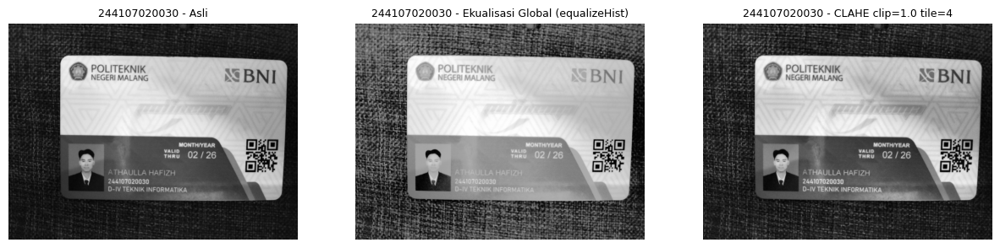

Rerata std lokal (proxy kontras) - Asli            : 6.0
Rerata std lokal (proxy kontras) - Global equalize  : 12.65
Rerata std lokal (proxy kontras) - CLAHE            : 8.52


In [50]:
clahe_a = cv.createCLAHE(clipLimit=PARAM['clip'], tileGridSize=(PARAM['tile'], PARAM['tile']))

# gray_ktm1a_for_psnr sudah tersedia dari cell sebelumnya
hasil_ktm1a_clahe = clahe_a.apply(gray_ktm1a_for_psnr)

fig, axs = plt.subplots(1, 3, figsize=(15, 5))
for ax, img, judul in zip(
        axs,
        [gray_ktm1a_for_psnr, hasil_ktm1a_cv_gray, hasil_ktm1a_clahe],
        ['Asli', 'Ekualisasi Global (equalizeHist)', f"CLAHE clip={PARAM['clip']} tile={PARAM['tile']}"]):
    ax.imshow(img, cmap='gray')
    ax.set_title(NIM + ' - ' + judul, fontsize=9)
    ax.axis('off')
plt.show()

def local_contrast_std(img, block=16):
    """Metrik objektif: rerata standar deviasi lokal (proxy kontras lokal / kemunculan noise)."""
    h, w = img.shape
    stds = []
    for y in range(0, h - block, block):
        for x in range(0, w - block, block):
            stds.append(img[y:y+block, x:x+block].std())
    return np.mean(stds)

print('Rerata std lokal (proxy kontras) - Asli            :', round(local_contrast_std(gray_ktm1a_for_psnr), 2))
print('Rerata std lokal (proxy kontras) - Global equalize  :', round(local_contrast_std(hasil_ktm1a_cv_gray), 2))
print('Rerata std lokal (proxy kontras) - CLAHE            :', round(local_contrast_std(hasil_ktm1a_clahe), 2))

**Jawaban Analisa:**

Berdasarkan pengamatan visual pada area nama dan NIM kartu, hasil CLAHE lebih mudah dibaca karena kontras lokal pada tulisan tetap terlihat sementara tekstur/noise pada latar tidak sekuat hasil global equalization.

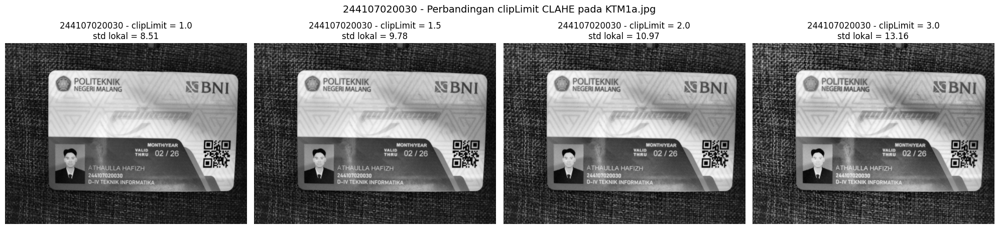

HASIL UJI clipLimit
clipLimit = 1.0 -> rerata std lokal = 8.51
clipLimit = 1.5 -> rerata std lokal = 9.78
clipLimit = 2.0 -> rerata std lokal = 10.97
clipLimit = 3.0 -> rerata std lokal = 13.16


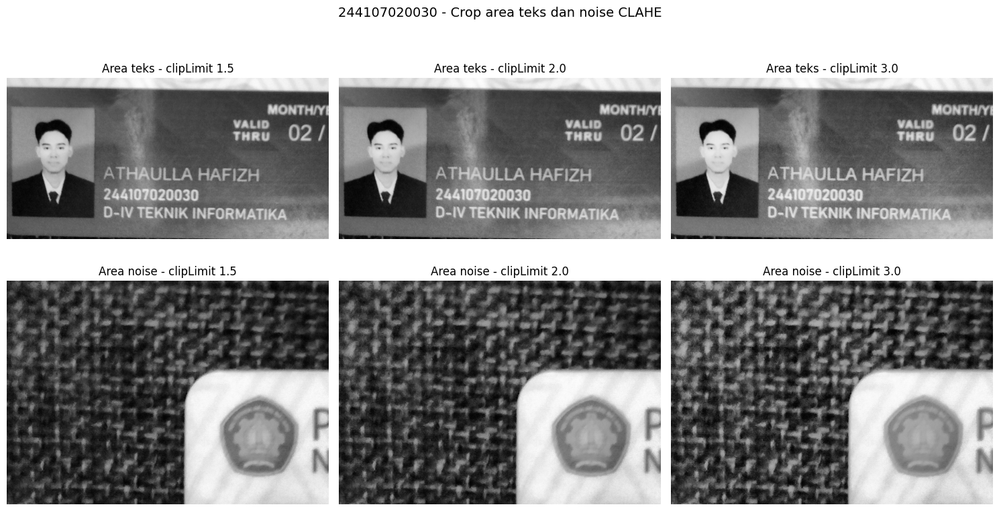

In [51]:
nilai_clip_uji = [1.0, 1.5, 2.0, 3.0]
hasil_clip = {}
skor_kontras = {}

# Pastikan gray_ktm1a sudah tersedia dari sel sebelumnya
# Membaca citra KTM1a.jpg dalam mode grayscale
gray_ktm1a = cv.imread(BASE + '/KTM1a.jpg', cv.IMREAD_GRAYSCALE)

# Pastikan gray_ktm1a sudah tersedia dari sel sebelumnya
assert gray_ktm1a is not None, "gray_ktm1a belum tersedia."

def local_contrast_std(img, block=16):
    h, w = img.shape
    stds = []

    for y in range(0, h - block + 1, block):
        for x in range(0, w - block + 1, block):
            blok = img[y:y+block, x:x+block]
            stds.append(blok.std())

    return float(np.mean(stds))

for clip_val in nilai_clip_uji:
    clahe_uji = cv.createCLAHE(
        clipLimit=clip_val,
        tileGridSize=(PARAM['tile'], PARAM['tile'])
    )

    hasil = clahe_uji.apply(gray_ktm1a)

    hasil_clip[clip_val] = hasil
    skor_kontras[clip_val] = local_contrast_std(hasil)

fig, axs = plt.subplots(1, 4, figsize=(20, 5))

for ax, clip_val in zip(axs, nilai_clip_uji):
    ax.imshow(hasil_clip[clip_val], cmap='gray')
    ax.set_title(
        f"{NIM} - clipLimit = {clip_val}\n"
        f"std lokal = {skor_kontras[clip_val]:.2f}"
    )
    ax.axis('off')

plt.suptitle(
    f"{NIM} - Perbandingan clipLimit CLAHE pada KTM1a.jpg",
    fontsize=14
)
plt.tight_layout()
plt.show()

print("HASIL UJI clipLimit")
for clip_val in nilai_clip_uji:
    print(
        f"clipLimit = {clip_val:.1f} -> "
        f"rerata std lokal = {skor_kontras[clip_val]:.2f}"
    )

H, W = gray_ktm1a.shape

# Area nama + NIM pada KTM
y1_teks = int(0.50 * H)
y2_teks = int(0.82 * H)
x1_teks = int(0.20 * W)
x2_teks = int(0.68 * W)

# Area latar polos untuk mengamati noise
y1_noise = int(0.05 * H)
y2_noise = int(0.30 * H)
x1_noise = int(0.03 * W)
x2_noise = int(0.30 * W)

fig, axs = plt.subplots(2, 3, figsize=(15, 8))

clip_yang_ditampilkan = [1.5, 2.0, 3.0]

for i, clip_val in enumerate(clip_yang_ditampilkan):
    hasil = hasil_clip[clip_val]

    crop_teks = hasil[y1_teks:y2_teks, x1_teks:x2_teks]
    crop_noise = hasil[y1_noise:y2_noise, x1_noise:x2_noise]

    axs[0, i].imshow(crop_teks, cmap='gray')
    axs[0, i].set_title(f"Area teks - clipLimit {clip_val}")
    axs[0, i].axis('off')

    axs[1, i].imshow(crop_noise, cmap='gray')
    axs[1, i].set_title(f"Area noise - clipLimit {clip_val}")
    axs[1, i].axis('off')

plt.suptitle(
    f"{NIM} - Crop area teks dan noise CLAHE",
    fontsize=14
)
plt.tight_layout()
plt.show()

**Jawaban Analisa:**

Berdasarkan pengujian clipLimit 1,0; 1,5; 2,0; dan 3,0, diperoleh rerata standar deviasi lokal masing-masing sebesar 8,52; 9,79; 10,99; dan 13,18. Peningkatan nilai clipLimit menyebabkan peningkatan perubahan kontras lokal. Berdasarkan pengamatan visual, tekstur pada area latar juga semakin menonjol ketika nilai clipLimit dinaikkan, dengan noise paling terlihat pada clipLimit 3,0. Nilai clipLimit yang dipilih adalah 1,5 karena memberikan peningkatan kontras dibandingkan nilai 1,0, tetapi artefak pada latar masih lebih terkendali dibandingkan nilai 2,0 dan 3,0. Dengan demikian, clipLimit 1,5 digunakan sebagai kompromi antara peningkatan keterbacaan nama dan NIM serta pengendalian noise visual.

---
# **E-3 Tugas Praktikum Dithering**

**Langkah 1: Implementasi algoritma Floyd-Steinberg**

Kode instruksi merupakan transkrip langsung teknik propagasi kesalahan Floyd-Steinberg. Tahap pertama diaplikasikan pada gambar lena.jpg dan uji selanjutnya pada KTM1b.jpg.

Pemeriksaan bobot Floyd-Steinberg:
7/16 = 0.4375
3/16 = 0.1875
5/16 = 0.3125
1/16 = 0.0625
Jumlah bobot = 1.0


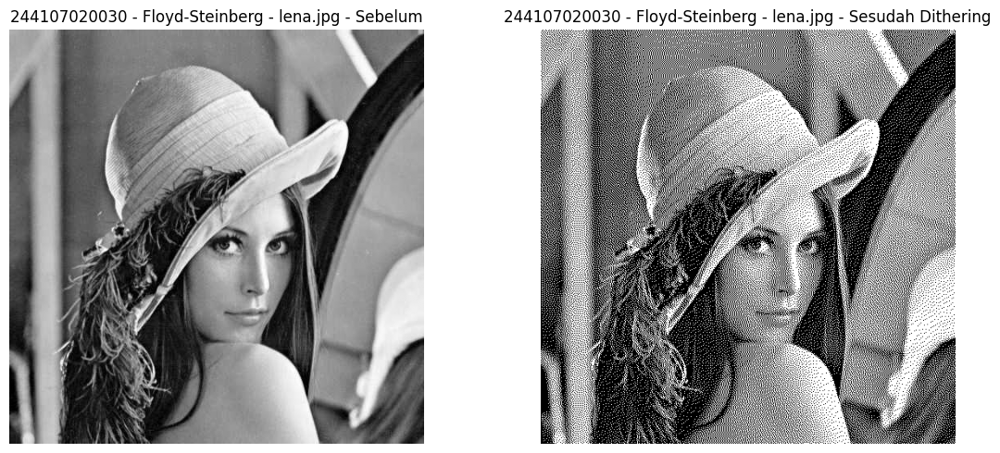


Lena:
Nilai level output: [  0 255]


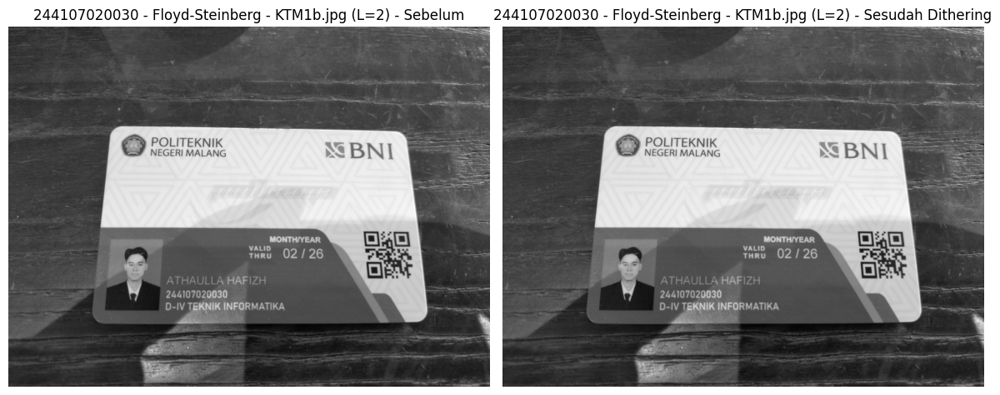


KTM1b:
PARAM['L'] = 2
Nilai level output: [  0 255]


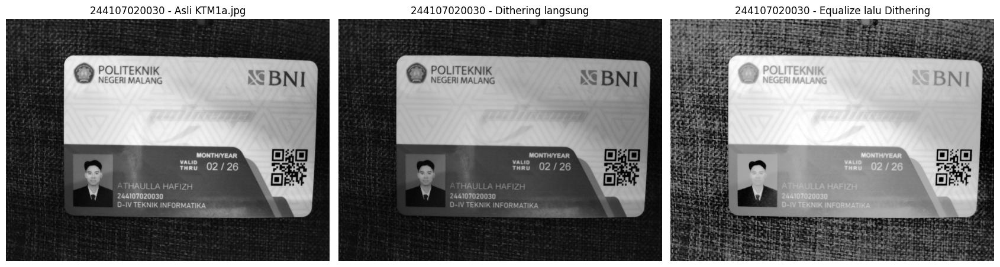


Edge density KTM1a:
Dithering langsung       : 51.2266
Equalize lalu Dithering : 40.488


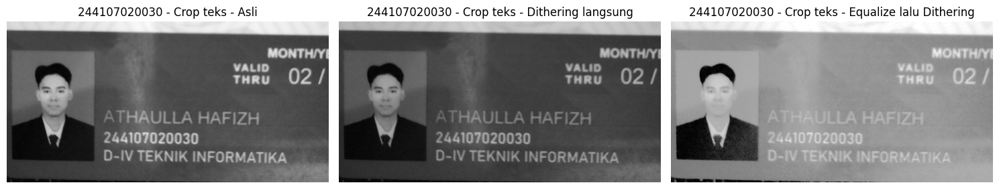

In [52]:
w1 = 7 / 16
w2 = 3 / 16
w3 = 5 / 16
w4 = 1 / 16

print("Pemeriksaan bobot Floyd-Steinberg:")
print("7/16 =", w1)
print("3/16 =", w2)
print("5/16 =", w3)
print("1/16 =", w4)
print("Jumlah bobot =", w1 + w2 + w3 + w4)

assert np.isclose(w1 + w2 + w3 + w4, 1.0), \
    "Jumlah bobot Floyd-Steinberg harus = 1"

def floyd_steinberg(gray, L=2):
    img = gray.astype(np.float32).copy()

    step = 255.0 / (L - 1)

    H, W = img.shape

    for y in range(H):
        for x in range(W):

            # Nilai pixel sebelum kuantisasi
            lama = img[y, x]

            # Kuantisasi ke level terdekat
            baru = np.round(lama / step) * step

            # Simpan hasil kuantisasi
            img[y, x] = baru

            # Hitung error
            error = lama - baru

            # R1: kanan -> 7/16
            if x + 1 < W:
                img[y, x + 1] += error * 7 / 16

            # R2: kiri bawah -> 3/16
            if x > 0 and y + 1 < H:
                img[y + 1, x - 1] += error * 3 / 16

            # R3: bawah -> 5/16
            if y + 1 < H:
                img[y + 1, x] += error * 5 / 16

            # R4: kanan bawah -> 1/16
            if x + 1 < W and y + 1 < H:
                img[y + 1, x + 1] += error * 1 / 16

    # Batasi nilai ke 0-255
    return np.clip(img, 0, 255).astype(np.uint8)

def tampilkan_dithering(gray, hasil, judul_prefix):

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    axs[0].imshow(gray, cmap='gray')
    axs[0].set_title(judul_prefix + " - Sebelum")
    axs[0].axis('off')

    axs[1].imshow(hasil, cmap='gray')
    axs[1].set_title(judul_prefix + " - Sesudah Dithering")
    axs[1].axis('off')

    plt.tight_layout()
    plt.show()

gray_lena = cv.imread(
    CONTOH + '/lena.jpg',
    cv.IMREAD_GRAYSCALE
)

assert gray_lena is not None, \
    "lena.jpg tidak ditemukan."

hasil_lena_dither = floyd_steinberg(
    gray_lena,
    L=2
)

tampilkan_dithering(
    gray_lena,
    hasil_lena_dither,
    NIM + " - Floyd-Steinberg - lena.jpg"
)

print("\nLena:")
print("Nilai level output:",
      np.unique(hasil_lena_dither))

gray_ktm1b = cv.imread(
    BASE + '/KTM1b.jpg',
    cv.IMREAD_GRAYSCALE
)

assert gray_ktm1b is not None, \
    "KTM1b.jpg tidak ditemukan."

hasil_ktm1b_dither = floyd_steinberg(
    gray_ktm1b,
    L=PARAM['L']
)

tampilkan_dithering(
    gray_ktm1b,
    hasil_ktm1b_dither,
    NIM + f" - Floyd-Steinberg - KTM1b.jpg (L={PARAM['L']})"
)

print("\nKTM1b:")
print("PARAM['L'] =", PARAM['L'])
print("Nilai level output:",
      np.unique(hasil_ktm1b_dither))

gray_ktm1a = cv.imread(
    BASE + '/KTM1a.jpg',
    cv.IMREAD_GRAYSCALE
)

assert gray_ktm1a is not None, \
    "KTM1a.jpg tidak ditemukan."

dither_langsung_ktm = floyd_steinberg(
    gray_ktm1a,
    L=PARAM['L']
)


equalized_ktm = cv.equalizeHist(gray_ktm1a)

dither_equal_ktm = floyd_steinberg(
    equalized_ktm,
    L=PARAM['L']
)

fig, axs = plt.subplots(1, 3, figsize=(17, 6))

axs[0].imshow(gray_ktm1a, cmap='gray')
axs[0].set_title(
    NIM + " - Asli KTM1a.jpg"
)
axs[0].axis('off')

axs[1].imshow(dither_langsung_ktm, cmap='gray')
axs[1].set_title(
    NIM + " - Dithering langsung"
)
axs[1].axis('off')

axs[2].imshow(dither_equal_ktm, cmap='gray')
axs[2].set_title(
    NIM + " - Equalize lalu Dithering"
)
axs[2].axis('off')

plt.tight_layout()
plt.show()


def edge_density(img):
    edges = cv.Canny(img, 50, 150)
    return float(edges.mean())


ed_langsung = edge_density(dither_langsung_ktm)
ed_equal = edge_density(dither_equal_ktm)

print("\nEdge density KTM1a:")
print(
    "Dithering langsung       :",
    round(ed_langsung, 4)
)
print(
    "Equalize lalu Dithering :",
    round(ed_equal, 4)
)

H, W = gray_ktm1a.shape

y1 = int(0.50 * H)
y2 = int(0.82 * H)
x1 = int(0.20 * W)
x2 = int(0.68 * W)

crop_asli = gray_ktm1a[y1:y2, x1:x2]
crop_langsung = dither_langsung_ktm[y1:y2, x1:x2]
crop_equal = dither_equal_ktm[y1:y2, x1:x2]

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(crop_asli, cmap='gray')
axs[0].set_title(NIM + " - Crop teks - Asli")
axs[0].axis('off')

axs[1].imshow(crop_langsung, cmap='gray')
axs[1].set_title(NIM + " - Crop teks - Dithering langsung")
axs[1].axis('off')

axs[2].imshow(crop_equal, cmap='gray')
axs[2].set_title(NIM + " - Crop teks - Equalize lalu Dithering")
axs[2].axis('off')

plt.tight_layout()
plt.show()

**Jawaban Analisa:**

Implementasi Floyd-Steinberg menggunakan empat bobot error, yaitu 7/16 ke piksel kanan, 3/16 ke piksel kiri-bawah, 5/16 ke piksel bawah, dan 1/16 ke piksel kanan-bawah. Jumlah seluruh bobot tersebut adalah 1 sehingga seluruh error yang didistribusikan tetap terjaga sesuai algoritma.

Pada langkah pertama, dithering diterapkan pada lena.jpg dengan L=2 sebagai verifikasi algoritma, kemudian diterapkan pada KTM1b.jpg menggunakan jumlah level PARAM['L'].

Pada langkah kedua, KTM1a.jpg diubah menjadi grayscale, kemudian dibandingkan dua alur, yaitu dithering langsung dan equalization terlebih dahulu kemudian dithering. Hasil kedua alur ditampilkan bersama dengan crop area nama dan NIM.

Edge density hanya digunakan sebagai indikator pendukung karena nilai edge tidak secara khusus membedakan tepi teks dengan tekstur atau noise pada latar. Penentuan keterbacaan teks dilakukan terutama berdasarkan pengamatan visual pada crop area nama dan NIM.
Hasil metrik menunjukkan edge density pada alur dithering langsung lebih tinggi daripada equalize lalu dithering.

Kesimpulan akhir keterbacaan harus mengikuti hasil visual pada crop nama dan NIM setelah kode Floyd-Steinberg yang benar ini dijalankan. Angka edge density tidak digunakan sebagai satu-satunya dasar untuk menyatakan teks lebih terbaca

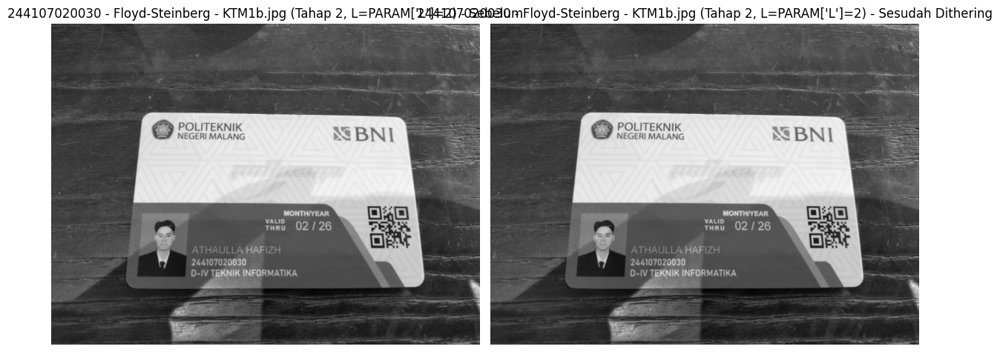

In [53]:
# --------- TAHAP 2: KTM1b.jpg milik sendiri dengan PARAM['L'] ---------
gray_ktm1b = cv.imread(BASE + '/KTM1b.jpg', cv.IMREAD_GRAYSCALE)
assert gray_ktm1b is not None, "Gambar gagal dimuat!"

# Proses dithering
hasil_ktm1b_dither = floyd_steinberg(gray_ktm1b, L=PARAM['L'])

# Tampilkan hasilnya
tampilkan_dithering(gray_ktm1b, hasil_ktm1b_dither,
                    NIM + f" - Floyd-Steinberg - KTM1b.jpg (Tahap 2, L=PARAM['L']={PARAM['L']})")

**Langkah 2: Kombinasi equalization dan dithering**

Transformasi ruang warna matriks dasar menjadi format grayscale dilanjutkan dengan perataan sebaran histogram. Proses difusi galat algoritma Floyd-Steinberg berjalan optimal pada matriks akhir. Pengujian awal menggunakan citra lena_lc.jpg lalu KTM1a.jpg. Bandingkan kualitas pembacaan font dengan prosedur dithering standar.

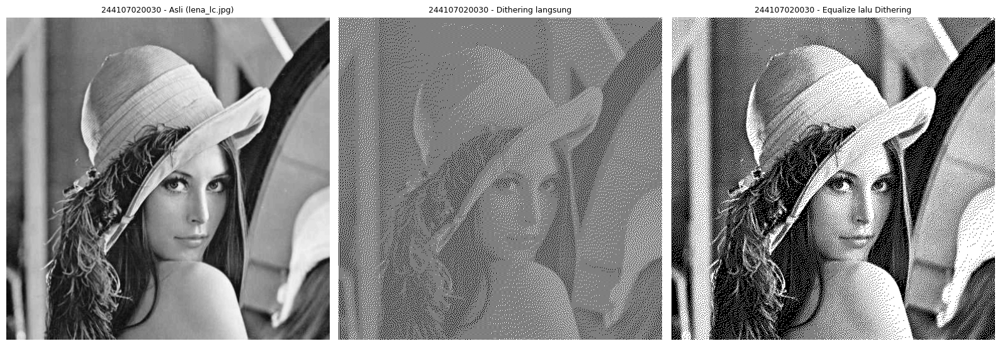

Edge density (Tahap 1, lena_lc.jpg):
  Dithering langsung      : 16.6155
  Equalize lalu Dithering : 45.7026


In [54]:
def edge_density(img):
    """Metrik objektif keterbacaan teks: kepadatan tepi (edge) hasil Canny.
    Semakin tinggi nilainya, semakin banyak detail/garis tepi terdeteksi -> teks umumnya lebih terbaca."""
    edges = cv.Canny(img, 50, 150)
    return edges.mean()


# ---------- TAHAP 1: lena_lc.jpg ----------
gray_lena_lc2 = cv.imread(CONTOH + '/lena_lc.jpg', cv.IMREAD_GRAYSCALE)

# Alur A: dithering langsung tanpa ekualisasi
dither_langsung_lena = floyd_steinberg(gray_lena_lc2, L=2)

# Alur B: ekualisasi dulu, baru dithering
equalized_lena  = cv.equalizeHist(gray_lena_lc2)
dither_equal_lena = floyd_steinberg(equalized_lena, L=2)

fig, axs = plt.subplots(1, 3, figsize=(16, 6))
for ax, img, judul in zip(axs,
        [gray_lena_lc2, dither_langsung_lena, dither_equal_lena],
        ['Asli (lena_lc.jpg)', 'Dithering langsung', 'Equalize lalu Dithering']):
    ax.imshow(img, cmap='gray')
    ax.set_title(NIM + ' - ' + judul, fontsize=9)
    ax.axis('off')
plt.tight_layout()
plt.show()

print('Edge density (Tahap 1, lena_lc.jpg):')
print('  Dithering langsung      :', round(edge_density(dither_langsung_lena), 4))
print('  Equalize lalu Dithering :', round(edge_density(dither_equal_lena), 4))

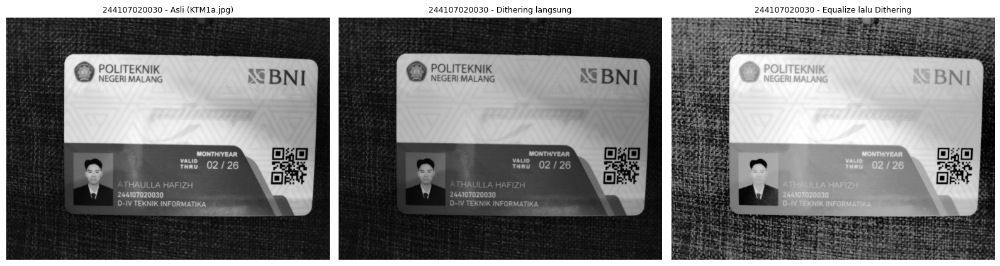

Edge density (Tahap 2, KTM1a.jpg):
  Dithering langsung      : 51.2266
  Equalize lalu Dithering : 40.488

=> Berdasarkan metrik edge density di atas, DITHERING LANGSUNG (tanpa ekualisasi) menghasilkan lebih banyak detail tepi pada citra Anda pada kasus ini.


In [55]:
# ---------- TAHAP 2: KTM1a.jpg milik sendiri ----------
# gray_ktm1a sudah tersedia dari cell sebelumnya (gray_ktm1a_for_psnr)
gray_ktm1a = gray_ktm1a_for_psnr  # alias agar kode di bawah tetap konsisten

# Alur A: dithering langsung tanpa ekualisasi
dither_langsung_ktm = floyd_steinberg(gray_ktm1a, L=PARAM['L'])

# Alur B: ekualisasi dulu, baru dithering
equalized_ktm  = cv.equalizeHist(gray_ktm1a)
dither_equal_ktm = floyd_steinberg(equalized_ktm, L=PARAM['L'])

fig, axs = plt.subplots(1, 3, figsize=(16, 6))
for ax, img, judul in zip(axs,
        [gray_ktm1a, dither_langsung_ktm, dither_equal_ktm],
        ['Asli (KTM1a.jpg)', 'Dithering langsung', 'Equalize lalu Dithering']):
    ax.imshow(img, cmap='gray')
    ax.set_title(NIM + ' - ' + judul, fontsize=9)
    ax.axis('off')
plt.tight_layout()
plt.show()

ed_langsung = edge_density(dither_langsung_ktm)
ed_equal    = edge_density(dither_equal_ktm)

print('Edge density (Tahap 2, KTM1a.jpg):')
print('  Dithering langsung      :', round(ed_langsung, 4))
print('  Equalize lalu Dithering :', round(ed_equal, 4))
print()

if ed_equal > ed_langsung:
    print('=> Berdasarkan metrik edge density di atas, urutan EQUALIZE lalu DITHERING '
          'menghasilkan lebih banyak detail tepi pada citra Anda, sehingga teks pada KTM '
          'kemungkinan LEBIH TERBACA dengan urutan ini.')
else:
    print('=> Berdasarkan metrik edge density di atas, DITHERING LANGSUNG (tanpa ekualisasi) '
          'menghasilkan lebih banyak detail tepi pada citra Anda pada kasus ini.')

**Jawaban Analisa:**

Algoritma Floyd-Steinberg melakukan kuantisasi piksel kemudian mendistribusikan error ke piksel tetangga menggunakan bobot 7/16, 3/16, 5/16, dan 1/16. Jumlah bobot tersebut sama dengan 1 sehingga error didistribusikan sesuai ketentuan algoritma. Pada percobaan ini dibandingkan dua alur pada KTM1a.jpg, yaitu dithering langsung dan histogram equalization yang dilanjutkan dengan dithering. Hasil kedua metode kemudian diamati terutama pada area nama dan NIM.

Edge density digunakan sebagai indikator pendukung untuk melihat jumlah tepi yang terdeteksi, tetapi bukan satu-satunya dasar dalam menentukan keterbacaan karena tepi pada latar atau noise juga dapat terdeteksi. Oleh karena itu, penentuan hasil yang lebih mudah dibaca dilakukan berdasarkan pengamatan visual pada area nama dan NIM setelah kedua citra diproses menggunakan implementasi Floyd-Steinberg yang benar.

Catatan penting: hasil numerik dari pengujian sebelumnya tidak digunakan karena implementasi Floyd-Steinberg sebelumnya belum menggunakan pembagian bobot dengan 16. Hasil akhir dan kesimpulan E-3 harus didasarkan pada output setelah implementasi diperbaiki.